<font size="7"><b>I trained 6 AIs to land a lunar lander, and ONE dominates all</b></font>

<font size="3">For my project in our deep learning course, I thought for a long time which deep learning task I should do. We have been doing image classification, natural language processing, and style transfer a lot in class, but I wanted to do something different. I like video games and I like to have fun in what I do. Then in our last session:</font>

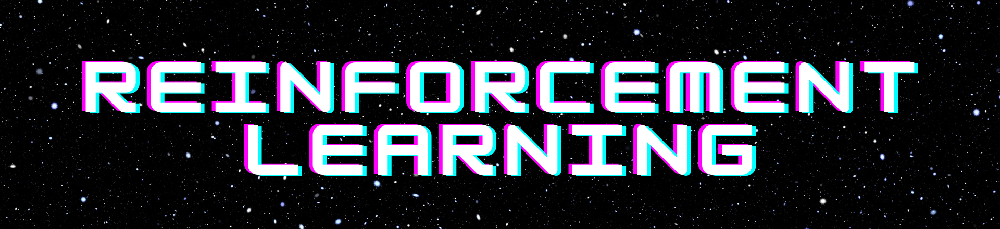

<center><font size="5">So I trained six AIs to do the Lunar Lander task.</font></center>

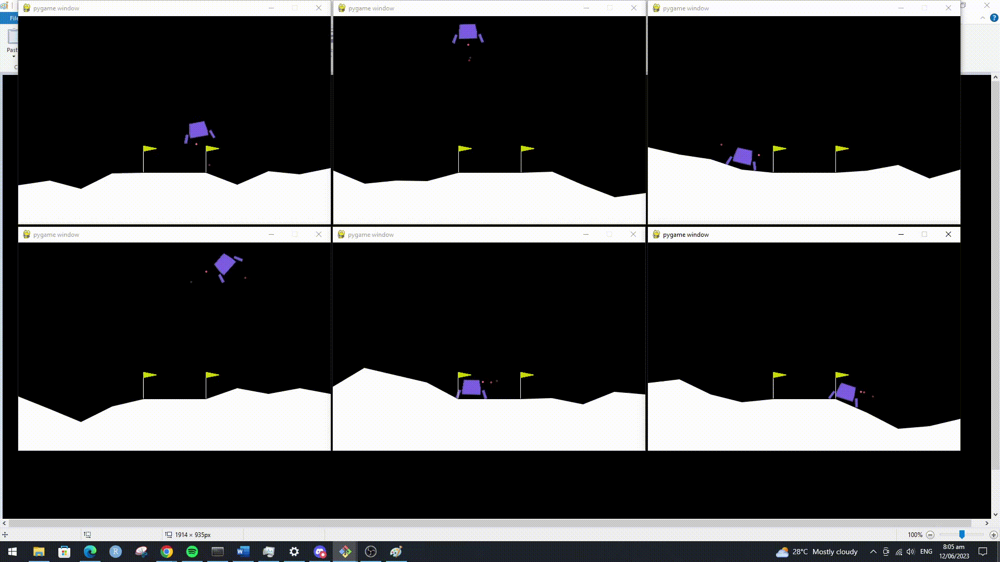

## How well did the six AIs perform?

<font size="4">After training, I let each model play the game 1000 times. Notably, **model 6** had the highest number of successful landings, with a total of 833. It was followed by model 3 which only had 598 successes.</font>

Although model 6 takes almost twice the time it takes model 3 to play one trial, model 6 had a much higher success rate. Lastly, model 6 also had the highest mean reward, which showcases that its performance is better than the others.

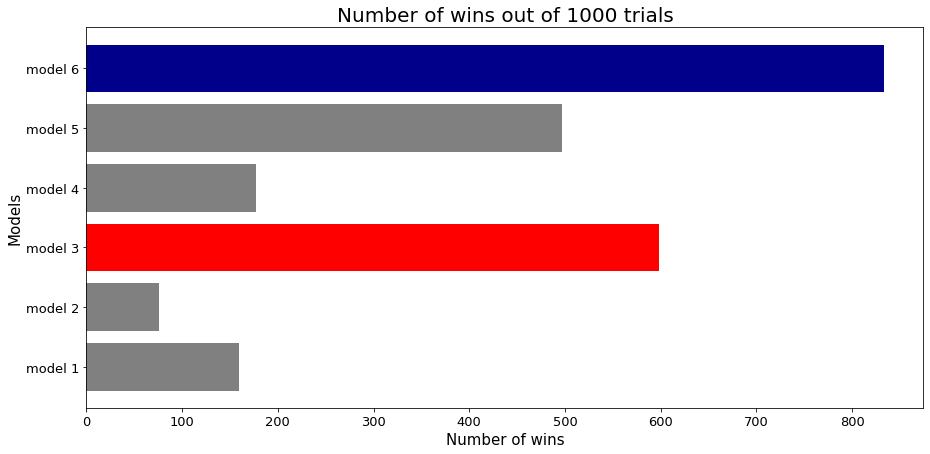

In [138]:
import matplotlib.pyplot as plt

num_solutions = [159, 76, 598, 177, 497, 833]
solution_prcnt = [15.9, 7.6, 59.8, 17.7, 49.7, 83.3]
mean_reward = [25.56, -112.05, 240.70, 12.88, 227.43, 520.01]
mean_num_steps = [743.59, 500.24, 396.31, 400.78, 467.46, 791.60]
models = ['model 1', 'model 2', 'model 3', 'model 4', 'model 5', 'model 6']
color = ['grey', 'grey', 'red', 'grey', 'grey', 'darkblue']
fig, ax = plt.subplots(figsize=(15, 7))
plt.barh(models, num_solutions, color=color)
# Set the labels and title
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel('Number of wins', fontsize=15)
plt.ylabel('Models', fontsize=15)
plt.title('Number of wins out of 1000 trials', fontsize=20)

# Display the plot
plt.show()

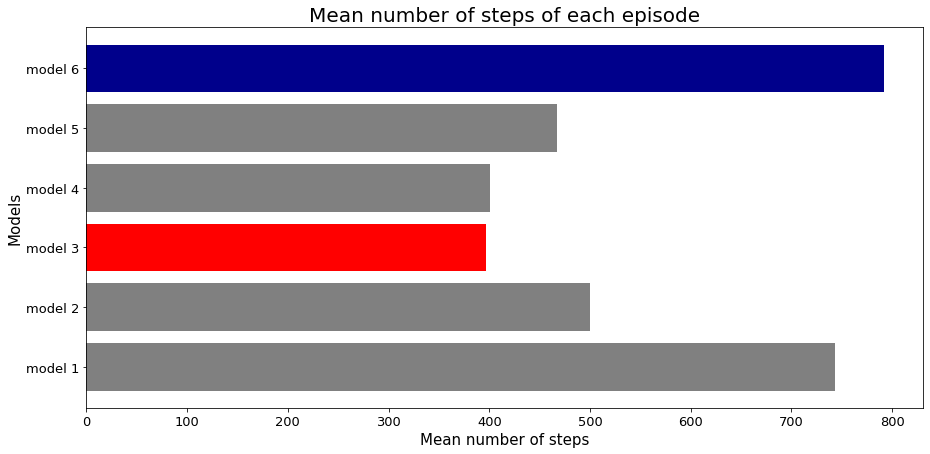

In [136]:
fig, ax = plt.subplots(figsize=(15, 7))
plt.barh(models, mean_num_steps, color=color)
# Set the labels and title
color = ['grey', 'grey', 'red', 'grey', 'grey', 'darkblue']
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel('Mean number of steps', fontsize=15)
plt.ylabel('Models', fontsize=15)
plt.title('Mean number of steps of each episode', fontsize=20)

# Display the plot
plt.show()

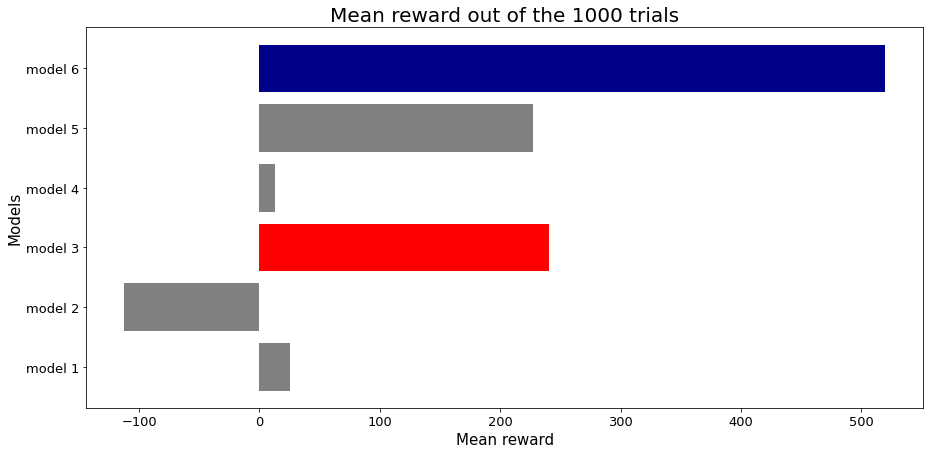

In [139]:
fig, ax = plt.subplots(figsize=(15, 7))
plt.barh(models, mean_reward, color=color)
# Set the labels and title
color = ['grey', 'grey', 'red', 'grey', 'grey', 'darkblue']
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel('Mean reward', fontsize=15)
plt.ylabel('Models', fontsize=15)
plt.title('Mean reward out of the 1000 trials', fontsize=20)

# Display the plot
plt.show()

**A more detailed discussion of the project is available below.**

## The Project

In this work, we explore various custom wrappers and the implementation of Deep Q-Learning Network (DQN) to solve the Lunar Lander (`LunarLander-v2`) task from the [OpenAI Gymnasium](https://gymnasium.farama.org/environments/box2d/lunar_lander/).

<br><center><img src="https://www.gymlibrary.dev/_images/lunar_lander.gif" autoplay="true"></center>
<br>*Note that the reader must have proficiency in Python in order to fully understand this study*.

## Task

The goal is to train an **agent** to control the landing of the lunar lander. We can think of the agent as the computer or artificial intelligence that is controlling the lander. While the lander is encouraged to land in between the two flags, landing outside the two flags is allowed and not considered as a failure.

Each trial, which we will call **episode**, ends when one of the three outcomes occurs. You can think of each episode as a game, which ends as "game over" when you lose or "success" when you win. 

The three possible outcomes are:

    1. The lander crashes, which means that the lander landed too fast.
    2. The lander goes outside the environment, which means that the lander went too far to the left or right.
    3. The lander successfully lands, whether it is between the two flags or not.
    
However, because it is also possible that the lander may hover around forever. To avoid those cases, we will also allow another outcome:

    4. The lander exceeds the allowed number of steps. The episode is then terminated.


## Actions

To control the lander, the agent can take one of these four **actions** at a time: 

    1. do nothing 
    2. fire left orientation engine
    3. fire main engine
    4. fire right orientation engine
    
These actions affect the **state** of the lander differently. We can think of state as the current condition of the lander: where is its current position, velocity, and angle. 

In Lunar Lander, these actions are mapped as follows:

<br>{0: do nothing, 
<br> 1: fire left orientation engine, 
<br> 2: fire main engine, 
<br> 3: fire right orientation engine}



## States

The **state** of the lander is encoded in eight variables:

|Variable|Description
|:---|:---|
|x position|the lander's current position in the x-coordinate
|y position|the lander's current position in the y-coordinate
|x velocity|the lander's current velocity in the x-axis
|y velocity|the lander's current velocity in the y-axis
|angle|angle of the tilt or orientation of the lander
|angular velocity|rate of change of the angle over time; how fast is its rotation
|left leg touching ground|1 if left leg is touching the ground; 0 otherwise
|right leg touching ground|1 if right leg is touching the ground; 0 otherwise


For example, in the array: [ 0.00559578,  1.3990338 ,  0.5670169 , -0.52829975, -0.00669544, -0.13270195,  0.        ,  0.        ], 

the x and y coordinates of the lander is (0.00559578,  1.3990338). The lander's legs are not touching the ground because the last two values are 0s.



## Rewards

As the agent observes the current state of the environment and chooses an action, 
the environment transitions to a new state, and also
returns a reward that indicates the consequences of the action.

|Reward / Penalty Points|Cause
|:---|:---|
|-100|the lander crashed
|+100|the lander landed safely, regardless of position
|+10|for each leg that is in contact with the ground
|-0.3|for each frame the main engine is firing
|-0.03|for each frame a side engine is firing

There are also miscellaneous positive (negative) rewards for decreasing (increasing) the distance to the landing pads.

<br>**The environment rewards the agent for landing inside the landing pad on both legs and penalizes it for using the engines. This encourages the agent to be efficient on its task.**

Lastly, an episode is considered a solution if it scores at least 200 points.

## Packages

Before we proceed, below are the packages utilized in this work. Only `trange` is not required, but it was used for tracking the progress of the iterative processes. Also note that a GPU was used for faster computations.

In [142]:
from collections import deque, namedtuple
from tqdm.notebook import trange
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torch.optim as optim
import gymnasium as gym
from gym import spaces
from torch import nn
import pandas as pd
import numpy as np
import random
import torch
device = (torch.device("cuda") if torch.cuda.is_available() 
          else torch.device("cpu"))
print(device)

cuda


## Lunar Lander Environment Initialization and Methods

The Lunar Lander environment can be initialized using the code below. The function `gym.make()` allows us to initialize an  available environment from Gymnasium. In this case, we are loading the Lunar Lander environment. By default, `enable_wind` is set to `False`. However, because I am interested in replicating its behavior a drone here on Earth, I set it to `True`. Lastly, if we want to see its animation while training, we can uncomment the `render_mode` argument. Note that there are other possible values for this argument, which is detailed here: [env.render()](https://gymnasium.farama.org/api/env/#gymnasium.Env.render).

In [8]:
env = gym.make('LunarLander-v2',
#                render_mode="human", # uncomment this line to see actual lunar lander
               enable_wind=True)

To demonstrate, we will explore the three methods of the environment `env`. The documentation is located here: [Env](https://gymnasium.farama.org/api/env/).

- env.reset(): Resets the environment to an initial internal state, returning an initial observation and info. 

    - The observation returned differs in type depending on the environment. For example, in Lunar Lander, the observation is represented by an array of length 8, representing the eight variables discussed earlier. In other words, the observation returned represents the initial state, encoded in the eight variables earlier.
    - The info returned contains auxiliary information about the observation. In the case of Lunar Lander, there is no auxillary information.
    - Note that `seed` can be used as a parameter to get reproducible observation and info. Run the two cells below repeatedly and observe that only the results of the first cell changes. (There are small discrepancies due to approximation in the second cell.)

In [19]:
env.reset()

(array([-0.00396805,  1.4040691 , -0.40135282, -0.30449682,  0.00407571,
         0.08056908,  0.        ,  0.        ], dtype=float32),
 {})

In [35]:
env.reset(seed=0)

(array([ 0.00559578,  1.3990338 ,  0.5670169 , -0.52829975, -0.00669544,
        -0.13270195,  0.        ,  0.        ], dtype=float32),
 {})

- env.step(): accepts an action as input and returns the consequences of the action in the environment. This method has to be run first after initialization of the environment and before running the other two methods. It returns the following (specifically in this order):
    - observation: the same observation discussed previously
    - reward: reward of taking that action
    - terminated: `True` if the episode is finished; `False` otherwise. In Lunar Lander, this means that one of the three outcomes discussed earlier has occurred. If `True`, `env.reset()` must be called to initialize a new episode.
    - truncated: `True` if the episode was ended prematurely; `False` otherwise. In Lunar Lander, this means that the fourth outcome discussed earlier has occurred. If `True`, `env.reset()` must be called to initialize a new episode.
    - info: the same info discussed previously
    

In the cell below, `0` indicates no action. The current state is returned and the episode has not been terminated or truncated yet. Note that rerunning the cell below will return new results because the lander is in a new state due to the previous step, gravity, wind, and turbulence. The last three factors are detailed here: [gravity, wind, and turbulence](https://gymnasium.farama.org/environments/box2d/lunar_lander/#arguments).

In [69]:
env.step(0)

(array([ 0.00851555,  1.4222809 ,  0.4367681 ,  0.23959008, -0.01068529,
        -0.10963178,  0.        ,  0.        ], dtype=float32),
 -0.7111145179780181,
 False,
 False,
 {})

- env.render(): computes the render frames as specified by `render_mode` during the initialization of the environment. In other words, this visualizes the environment.

To demonstrate, running the cell below will open a new pygame window. Because we have not instructed the agent to control the lander yet, the lander will not move.

In [68]:
env = gym.make('LunarLander-v2',
               render_mode="human",
               enable_wind=True)
env.reset()
env.render()

To close the window, use `env.close()`.

In [70]:
env.close()

## Wrappers: Customizing environments

From the documentation: "Wrappers are a convenient way to modify an existing environment without having to alter the underlying code directly." By using wrappers, we can change the observations, rewards, and actions without direct access to the code.

In order to wrap an environment, we must first initialize an environment. Then we can pass this environment to the wrapper. In other words, a wrapper is a class which accepts an initialized environment. Mainly there are three kinds of wrappers:

    1. Action Wrapper - modifies the action space of the environment. It can transform or preprocess the actions before they are applied to the environment. For example, it can discretize a continuous action space, add noise to the actions, or apply action masking.
    2. Observation Wrapper - modifies the observation space of the environment. It can transform or preprocess the observations before they are returned to the agent. For example, it can normalize the observations, apply image processing, or extract specific features
    3. Reward Wrapper - modifies the reward signal of the environment. It can transform or preprocess the rewards before they are returned to the agent. For example, it can scale the rewards, apply shaping or discounting, or introduce additional rewards based on certain conditions.
    4. Miscellaneous Wrapper - modifies the environment differently from the previously defined wrappers. 
    
More information about wrappers can be retrieved here: [Wrappers](https://gymnasium.farama.org/api/wrappers/).

As an example, the code below illustrates how to construct a wrapper that adds an additional action to the list of actions that the lander can do. 

In [83]:
"""
Because we are adding another action, 
we define our wrapper to be an Action Wrapper.
"""
class DualEngineEnv(gym.ActionWrapper):
    """
    the input in a wrapper is the environment;
    hence, the `env` in __init__
    """
    def __init__(self, env):
        """
        We want to inherit the same action space.
        The `elf.env.action_space.n` gives the total number of actions,
        and we are adding 1 because we want to add a new action.
        
        We then use spaces.Discrete to set the type of the `action_space`,
        which should be Discrete. This can be verified by running the code
        `env.action_space` in a new cell.
        """
        super().__init__(env)
        self.action_space = spaces.Discrete(self.env.action_space.n + 1)
        self.observation_space = self.env.observation_space

    def step(self, action):
        """
        If the action is 0, 1, 2, or 3, then we proceed with what the Lunar
        Lander environment does.

        If action is 4, that means that is the new action. We want the action
        to be simultaneously firing the left and right engine. The effect of that
        action would be setting the x-velocity of the lander to 0.
        
        Also, because we are using both engines, we subtract 0.06 
        (0.03 for each engine) from the reward.
        """
        if action < self.env.action_space.n:
            observation, reward, terminated, truncated, info = self.env.step(action)
        else:
            observation, reward, terminated, truncated, info = self.env.step(0)
            observation[2] = 0
            reward -= 0.06
        return observation, reward, terminated, truncated, info
    
    """
    We inherit the same reset method from the original environment.
    """
    def reset(self, seed=None):
        return self.env.reset(seed=seed)

    def render(self):
        return self.env.render()

    def close(self):
        return self.env.close()

Other wrappers used in this work is shown below. The six scenarios considered are:

Model 1: No wrapper, wind enabled (WE)

Model 2: WE + Additional action of firing both side engines simultaneously

Model 3: WE + Multiplying rewards between 0 and 100 by 1.5

Model 4: Model 2 + Model 3

Model 5: Model 4 + distance from center penalty

Model 6: Model 5, but change multipliers for reward and penalty


In [ ]:
"""Model 2
- this is exactly the same as the first example
"""
class DualEngineEnv(gym.ActionWrapper):
    def __init__(self, env):
        super().__init__(env)
        self.action_space = spaces.Discrete(self.env.action_space.n + 1)
        self.observation_space = self.env.observation_space
    
    def step(self, action):
        if action < self.env.action_space.n:
            observation, reward, terminated, truncated, info = self.env.step(action)
        else:
            observation, reward, terminated, truncated, info = self.env.step(0)
            observation[2] = 0
            reward -= 0.06        
        return observation, reward, terminated, truncated, info
    
    def reset(self, seed=None):
        return self.env.reset(seed=seed)

    def render(self):
        return self.env.render()

    def close(self):
        return self.env.close()

In [ ]:
"""Model 3
- multiplies the reward by 1.5 if it is between 0 and 100.
    This rewards positive actions more, but does not provide
    extra reward if the reward is already high.
"""
class DualEngineEnv(gym.ActionWrapper):
    def __init__(self, env):
        super().__init__(env)
        self.action_space = self.env.action_space
        self.observation_space = self.env.observation_space
    
    def step(self, action):
        observation, reward, terminated, truncated, info = self.env.step(action)
        if (reward > 0) and (reward < 100):
            reward *= 1.5
        return observation, reward, terminated, truncated, info
    
    def reset(self, seed=None):
        return self.env.reset(seed=seed)

    def render(self):
        return self.env.render()

    def close(self):
        return self.env.close()

In [84]:
"""Model 4"""
class DualEngineEnv(gym.ActionWrapper):
    def __init__(self, env):
        super().__init__(env)
        self.action_space = spaces.Discrete(self.env.action_space.n + 1)
        self.observation_space = self.env.observation_space
    
    def step(self, action):
        if action < self.env.action_space.n:
            observation, reward, terminated, truncated, info = self.env.step(action)
        else:
            observation, reward, terminated, truncated, info = self.env.step(0)
            observation[2] = 0
            reward -= 0.06
        if (reward > 0) and (reward < 100):
            reward *= 1.5
            
        return observation, reward, terminated, truncated, info
    
    def reset(self, seed=None):
        return self.env.reset(seed=seed)

    def render(self):
        return self.env.render()

    def close(self):
        return self.env.close()

In [87]:
"""Model 5
- Model 4 + adds a penalty to the distance of the lander to the center of 
    the landing pad. The farther the distance, the greater the penalty.
"""
class DualEngineEnv(gym.ActionWrapper, gym.ObservationWrapper):
    def __init__(self, env):
        super().__init__(env)
        self.action_space = spaces.Discrete(self.env.action_space.n + 1)
        self.observation_space = self.env.observation_space
        
    def step(self, action):
        if action < self.env.action_space.n:
            observation, reward, terminated, truncated, info = self.env.step(action)
            
        # else, that means it uses both left and right engines.
        # reset the x velocity and reduce reward by 0.06(0.03 each engine)
        else:
            observation, reward, terminated, truncated, info = self.env.step(0)
            observation[2] = 0
            reward -= 0.06
        
        # Compute distance from current x-coordinate to target x-coordinate
        target_x = 0 # your target is the middle in terms of x-coordinate
        current_x = observation[0]
        x_distance = abs(target_x - current_x)

        # Modify the reward based on the x-coordinate distance
        x_penalty = x_distance * 0.05  # Adjust the penalty factor as desired
        reward -= x_penalty        
        # if final reward is between 0 and 100, then give it an additional 50% reward
        if (reward > 0) and (reward < 100):
            reward *= 1.5
        
        return observation, reward, terminated, truncated, info
       
    def reset(self, seed=None):
        return self.env.reset(seed=seed)

    def render(self):
        return self.env.render()

    def close(self):
        return self.env.close()

In [140]:
"""Model 5
- similar to Model 5, but lower distance penalty 
    and higher reward multiplier.
"""
class DualEngineEnv(gym.ActionWrapper):
    def __init__(self, env):
        super().__init__(env)
        self.action_space = spaces.Discrete(self.env.action_space.n + 1)
        self.observation_space = self.env.observation_space
        
    def step(self, action):
        if action < self.env.action_space.n:
            observation, reward, terminated, truncated, info = self.env.step(action)
            
        # else, that means it uses both left and right engines.
        # reset the x velocity and reduce reward by 0.06(0.03 each engine)
        else:
            observation, reward, terminated, truncated, info = self.env.step(0)
            observation[2] = 0
            reward -= 0.06
        
        # Compute distance from current x-coordinate to target x-coordinate
        target_x = 0 # your target is the middle in terms of x-coordinate
        current_x = observation[0]
        x_distance = abs(target_x - current_x)

        # Modify the reward based on the x-coordinate distance
        x_penalty = x_distance * 0.025  # Adjust the penalty factor as desired
        reward -= x_penalty
        # if final reward is between 0 and 100, then double it
        if (reward > 0) and (reward < 100):
            reward *= 2
        
        return observation, reward, terminated, truncated, info
       
    def reset(self):
        return self.env.reset()

    def render(self):
        return self.env.render()

    def close(self):
        return self.env.close()

## Using Wrappers


To use wrappers, simply initialize an environment and use it as an input to the wrapper as shown below.

In [88]:
env = gym.make('LunarLander-v2',
#                render_mode="human", # uncomment this line to see actual lunar lander
               enable_wind=True)
env = DualEngineEnv(env)
state, info = env.reset()

# 1 added action; total of 5 actions 
print(env.action_space.n)

5


In [143]:
# if running model 1, do not use DualEngineEnv
env = gym.make('LunarLander-v2',
#                render_mode="human", # uncomment this line to see actual lunar lander
               enable_wind=True)
state, info = env.reset()

# 1 added action; total of 5 actions 
print(env.action_space.n)

4


## Model: Deep Q-Learning Network (DQN)

DQN (Deep Q-Network) is a reinforcement learning algorithm that combines Q-learning, a popular value-based RL algorithm, with deep neural networks. The key idea behind DQN is to approximate the optimal action-value function, called the Q-function, using a deep neural network. Overall, DQN combines deep neural networks with Q-learning to learn policies in complex environments. It has achieved impressive results in a wide range of domains, including playing Atari games, controlling robots, and more.

More in-depth discussions on DQN are available online.

In this study, we will be using a fully connected neural network with two [64,64] hidden layers that takes in state observations $s$ as input.
- If we are not using the wrappers, the model has four outputs representing $Q(s, \mathrm{do\ nothing})$, $Q(s, \mathrm{fire\ left})$, $Q(s, \mathrm{fire\ main})$, and $Q(s, \mathrm{fire\ right})$. 
- If we are using one of the wrappers defined earlier, the model would have five outputs. The additional output is $Q(s, \mathrm{fire\ both\ left\ and\ right})$.

The network is trying to predict the *expected return* of taking each action given the current input.

In [144]:
s = 3314
class DQN(nn.Module):
    def __init__(self, num_observations, num_actions, seed=s, layers=(64, 64)):
        super().__init__()
        self.seed = torch.manual_seed(seed)
        self.inputs = nn.Linear(num_observations, layers[0])
        self.layer1 = nn.Linear(layers[0], layers[1])
        self.layer2 = nn.Linear(layers[1], num_actions)
        
    def forward(self, x):
        x = F.relu(self.inputs(x))
        x = F.relu(self.layer1(x))
        x = self.layer2(x)
        return x

## Replay Buffer

A **replay buffer** is a data structure used to store and recall experiences during training. The purpose of a replay buffer is to decouple the sample collection from the learning step. Instead of immediately using the data from each interaction with the environment for learning, the experiences (state, action, reward, next state, and terminal flag) are stored in the replay buffer. The replay buffer then serves as a dataset from which the agent samples and learns.

The key benefits of using a replay buffer are:

- **Experience Replay:** By storing experiences in a replay buffer, the agent can learn from a more diverse and representative set of experiences. This is because the agent may encounter rare or important events during exploration that can be replayed multiple times during training, allowing for better learning and generalization.

- **Break Correlation:** In many reinforcement learning tasks, consecutive experiences are highly correlated due to the sequential nature of the agent's interactions with the environment. This correlation can lead to unstable learning and slow convergence. By randomly sampling from the replay buffer, the agent breaks the correlation between consecutive experiences and reduces bias, leading to more stable and efficient learning.

- **Data Efficiency:** The replay buffer allows the agent to reuse past experiences multiple times, effectively utilizing the collected data more efficiently. This is especially useful in situations where interacting with the environment is time-consuming or expensive, as the agent can learn from a diverse set of experiences without requiring additional interactions.

In summary, a replay buffer helps stabilize and improve the learning process in reinforcement learning by storing and randomly sampling past experiences, enabling the agent to learn from a diverse set of data and break correlations between consecutive experiences.

The replay buffer is a first-in-first-out (FIFO) storage with finite capacity, which we will implement as a `deque`.

In [145]:
transition = namedtuple('transition', ['action', 'state', 'state_next', 'reward', 'done'])

class ReplayBuffer(object):
    def __init__(self, capacity):
        self.memory = deque([], maxlen=capacity)

    def push(self, *args):
        """Save a transition"""
        self.memory.append(transition(*args))

    def sample(self, batch_size):
        samples = random.sample(self.memory, batch_size)
        samples = transition(*zip(*samples))

        action_sample = torch.tensor(samples.action).long().to(device)
        state_sample = torch.tensor(np.array(samples.state)).float().to(device)
        state_next_sample = torch.tensor(np.array(samples.state_next)).float().to(device)
        rewards_sample = torch.tensor(samples.reward).float().to(device)
        done_sample = torch.tensor(samples.done).float().to(device)

        return (
            action_sample,
            state_sample,
            state_next_sample,
            rewards_sample,
            done_sample,
        )

    def __len__(self):
        return len(self.memory)

## Agent


The agent is the one that interacts with the environment. In the context of Lunar Lander, the agent is controlling the lander. It must learn to control and safely land using the available actions.


The class `Agent` is defined below. The methods of the class collectively define the behavior of the agent, including interacting with the environment, choosing actions, learning from experiences, and saving/loading model weights.

- **__init__(self, num_observations, num_actions):** Initializes the agent by setting the number of observations (input dimensions) and actions in the environment. It creates two instances of the DQN model: model_policy and model_target. It also sets up the optimizer, replay buffer, and other variables.

- **step(self, action, state, state_next, reward, done):** Called at each time step of the environment. It saves the action, states, reward, and termination information in the replay buffer. It then checks if it's time to update the model by sampling experiences from the replay buffer and calling the learn method. It also updates the target network periodically.

- **act(self, state, eps=0):** Takes a state as input and returns an action. It uses an epsilon-greedy policy to balance exploration and exploitation. With a certain probability, it selects a random action, otherwise, it uses the policy network to predict the action with the highest Q-value.

- **learn(self, experiences):** Updates the agent's model using a batch of experiences sampled from the replay buffer. It computes the loss between the predicted Q-values and the target Q-values using the Huber loss function. It then performs backpropagation to update the model's weights.

- **save(self, frame_count):** Saves the weights of the target network to a file with a specified frame count.

- **load(self, frame_count):** Loads the weights of the target network from a file with a specified frame count.

In [146]:
class Agent:
    "Interacts with the environment"

    def __init__(self, num_observations, num_actions):
        self.num_observations = num_observations
        self.num_actions = num_actions

        # The first model makes the predictions for Q-values which are used to make a action.
        self.model_policy = DQN(num_observations, num_actions).to(device)
        # Build a target model for the prediction of future rewards.
        # The weights of a target model get updated every `update_target_network` steps thus when the
        # loss between the Q-values is calculated the target Q-value is stable.
        self.model_target = DQN(num_observations, num_actions).to(device)
        self.model_target.load_state_dict(self.model_policy.state_dict())
        # Deepmind paper used RMSProp however then Adam optimizer is faster
        self.optimizer = optim.Adam(self.model_policy.parameters(), lr=1e-3)
        self.memory = ReplayBuffer(buffer_size)
        self.step_count = 0

    def step(self, action, state, state_next, reward, done):
        # Save actions and states in replay buffer
        self.memory.push(action, state, state_next, reward, done)

        self.step_count += 1
        # Update every `train_freq` frame if `batch_size` samples available
        if self.step_count % train_freq == 0 and len(self.memory) > batch_size:
            # sample the replay buffer
            experience_sample = self.memory.sample(batch_size)
            self.learn(experience_sample)

        if self.step_count % update_target_network == 0:
            # update the the target network with new weights
            # self.model_target.set_weights(self.model_policy.get_weights())
            # self.model_target.load_state_dict(self.model_policy.state_dict())
            tau = 1e-2
            for target_param, local_param in zip(self.model_target.parameters(),
                                                 self.model_policy.parameters()):
                target_param.data.copy_(tau*local_param.data + (1-tau)*target_param.data)

    def act(self, state, eps=0):
        # Use epsilon-greedy for exploration
        if epsilon > np.random.random():
            # Take random action
            action = torch.tensor(np.random.choice(self.num_actions), device=device).view(1, 1)
        else:
            self.model_policy.eval()
            with torch.no_grad():
                # Move the state to the GPU
                state = torch.from_numpy(state).unsqueeze(0).to(device)
                # Predict action Q-values from state
                action_probs = self.model_policy(state)
                # Take the best action
                action = action_probs.max(1)[1].view(1, 1)
            self.model_policy.train()
        return action
    
    def learn(self, experiences):
        loss_function = nn.SmoothL1Loss()  # Using huber loss for stability
        (
            action_sample,
            state_sample,
            state_next_sample,
            rewards_sample,
            done_sample,
        ) = experiences
        self.model_policy.train()
        self.model_target.eval()

        # Create a mask so we only calculate loss on the updated Q-values
        masks = F.one_hot(action_sample, self.num_actions)

        # Train the model on the states and updated Q-values
        q_values = self.model_policy(state_sample)
        
        with torch.no_grad():
            # Build the updated Q-values for the sampled future states
            # Use the target model for stability
            future_rewards = self.model_target(state_next_sample)
            # Q value = reward + discount factor * expected future reward
            updated_q_values = rewards_sample + gamma * future_rewards.max(1)[0] * (1 - done_sample)
            # final frame has no future reward

        # Apply the masks to the Q-values to get the Q-value for action taken
        q_action = torch.sum(torch.multiply(q_values, masks), dim=1)
        # Calculate loss between new Q-value and old Q-value
        loss = loss_function(updated_q_values, q_action)
        
        # backpropagation
        loss.backward()
        self.optimizer.step()
        self.optimizer.zero_grad()
        
    def save(self, frame_count):
#         torch.save(self.model_policy.state_dict(), f'policy_net_{frame_count}.pt')
        torch.save(self.model_target.state_dict(), f'target_net_{frame_count}.pt')
        
    def load(self, frame_count):
        load = f'target_net_{frame_count}.pt'
        self.model_policy.load_state_dict(torch.load(
            load, map_location=device))
        self.model_policy.eval()

        self.model_target.load_state_dict(torch.load(
            load, map_location=device))
        self.model_target.eval()

## Training the model

Some hyperparameters:

-  **epsilon_max, epsilon_min**, and **exploration_fraction:** controls the value of epsilon over training steps. Note that the amount of exploration of the agent decays over time to favor its learning and experience.
-  **update_target_network:** specifies the frequency at which the target network should be updated. For example, if update_target_network is set to 1000, the target network will be updated every 1000 steps.
-  **train_freq:** determines how often the agent performs a training update. It specifies the number of steps the agent takes before initiating a training update. If it is set to 4, it means that the agent will perform a training update every 4 steps.

Other hyperparameters are briefly explained in the comments below. Also, `num_timesteps` has been set to 10,000 as an example. Actual training of the models used 1,000,000 timesteps.

In [152]:
# Configuration paramaters for the whole setup
gamma = 0.99  # Discount factor for past rewards
epsilon_min = 0.05  # Minimum epsilon greedy parameter
epsilon_max = 0.90  # Maximum epsilon greedy parameter
epsilon = epsilon_max  # Epsilon greedy parameter
batch_size = 64  # Size of batch taken from replay buffer
max_steps_per_episode = 1000  # just a safety constraint
exploration_fraction = 0.60  # Fraction of frames for exploration
buffer_size = 50000  # Maximum replay length
train_freq = 4  # Train the model after 4 actions
update_target_network = 200  # How often to update the target network

episode_rewards = [0.0]

# use lower num_timesteps for debugging or demonstration
# num_timesteps = 1_000_000  # longer to train
num_timesteps = 10000 # debug or example
epsilon_greedy_frames = num_timesteps * exploration_fraction

"""In Lunar Lander:
- length of observation is 8
- the default number of actions is 4, as discussed previously
- but if you are using a wrapper that adds an additional action, the
`num_actions` should be 5."""
agent = Agent(num_observations=8, num_actions=4)
state, info = env.reset()
step_count = 0
for frame_count in range(1, num_timesteps + 1):
    action = agent.act(state, epsilon)

#     Apply the sampled action in our environment
#     observation, reward, terminated, truncated, info
    state_next, reward, done, _, info = env.step(action.cpu().numpy().squeeze())
    agent.step(action, state, state_next, reward, done)
    state = state_next
    episode_rewards[-1] += reward

    # Linear Decay probability of taking random action
    epsilon -= (epsilon_max - epsilon_min) / epsilon_greedy_frames
    epsilon = max(epsilon, epsilon_min)

    # Log details
    if frame_count % (5000) == 0:
        print(
            f"""running reward: {np.mean(episode_rewards[-20:]):.2f} at episode {len(episode_rewards)}, frames: {frame_count}"""
        )
    # if an episode takes too long, reset
    step_count += 1
    if step_count == max_steps_per_episode:
        done = True
        step_count = 0

    if done:
        state, info = env.reset()
        episode_rewards.append(0)

    # saving the model
    # feel free to modify this
    if frame_count in [1000, 10000, 100000, 250000, 500000, 750000, num_timesteps]:
        fn = str(frame_count)
        agent.save(fn)

running reward: -188.57 at episode 43, frames: 5000
running reward: -183.07 at episode 61, frames: 10000


## Visualization

We can plot the progression of rewards over time:

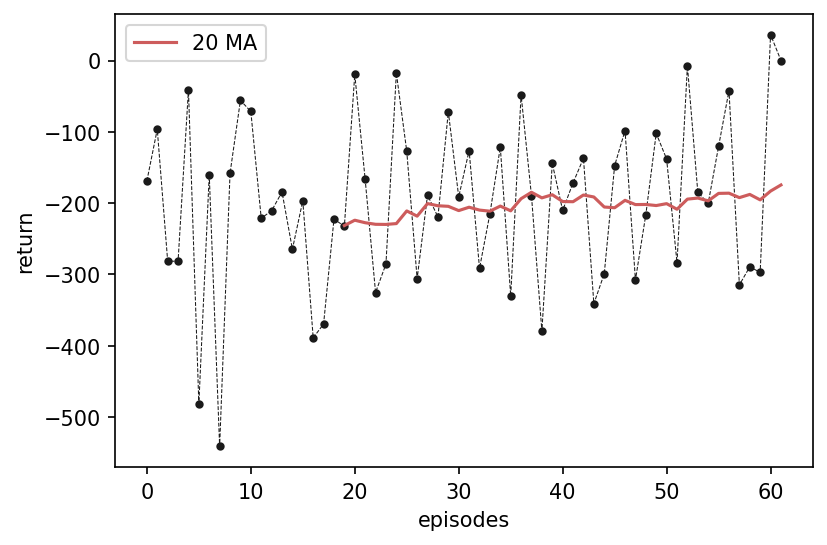

In [153]:
rolling_mean = (
    pd.Series(episode_rewards).rolling(window=20).mean()
)  # 20 episode moving average
plt.figure(dpi=150)
plt.plot(episode_rewards, c="0.1", lw=0.5, ls="--", marker="o", ms=3)
plt.plot(rolling_mean, c="indianred", label="20 MA")
plt.legend()
plt.xlabel("episodes")
plt.ylabel("return")

plt.savefig("MA_20.png")

We can also evaluate the current learned models by using them on the environment.
Since we are running on a local machine with the prerequisite packages, we can set `render=True` to have a screen display the environment. 

To evaluate the trained models, we will be looking at the number of episodes, number of "solutions", mean rewards, and mean number of steps. As an illustration, only 10 episodes were explored. Actual evaluation involved 1,000 episodes for each trained model.

In [155]:
env = gym.make('LunarLander-v2', enable_wind=True, render_mode="human")

"""if using any wrapper, uncomment out the line below"""
# env = DualEngineEnv(env)
state, info = env.reset(seed=0)

mod_name = '10000'
agent.load(mod_name)  # load trained models
render=True

max_steps_per_episode = 1000
episodes = 1000
# episodes = 10 # for debug or example
lst_num_episode_steps = []
lst_episode_rewards = []
for i in trange(episodes):
    num_episode_steps = 0
    eval_episode_rewards = 0
    while num_episode_steps < 1000:
        num_episode_steps += 1
        
        if render:
            env.render()

        with torch.no_grad():
            action = agent.act(state, epsilon)

        action = action.cpu().numpy().squeeze()
        state, reward, done, _, info = env.step(action)
        eval_episode_rewards += reward

        if done or (num_episode_steps == max_steps_per_episode):
            state, info = env.reset(seed=(i*episodes)+
                                    num_episode_steps+1)
            lst_num_episode_steps.append(num_episode_steps)
            lst_episode_rewards.append(eval_episode_rewards)
            # next episode
            break
            
# Print metrics
n = np.sum(np.array(lst_episode_rewards) >= 200)
d = len(lst_episode_rewards)
print(f"Number of Episodes: {d}")
print(f"Number of Solutions: {n}")
print(f"Solution Ratio: {100*(n / d):.2f}%")
print(f"Mean Reward: {np.mean(lst_episode_rewards):.2f}")
print(f"Mean Number of Steps: {np.mean(lst_num_episode_steps):.2f}")

  0%|          | 0/10 [00:00<?, ?it/s]

Number of Episodes: 10
Number of Solutions: 0
Solution Ratio: 0.00%
Mean Reward: -404.14
Mean Number of Steps: 181.40


In [156]:
# env.close() # run this if you used render_mode='human'

We will save this trained model for reuse later (as it takes some time to train the model until it performs well.)

## Generative AI Documentation

ChatGPT and Bard (Google) were used for this work for understanding the concepts, debugging the codes, and generating some of the explanations.

## References
1. https://keras.io/examples/rl/deep_q_network_breakout/
2. https://stable-baselines3.readthedocs.io/en/master/modules/dqn.html
3. https://stable-baselines.readthedocs.io/en/master/guide/examples.html#basic-usage-training-saving-loading
4. https://goodboychan.github.io/python/reinforcement_learning/pytorch/udacity/2021/05/07/DQN-LunarLander.html
5. https://gymnasium.farama.org/
6. https://deeplearning.neuromatch.io/projects/ReinforcementLearning/lunar_lander.html
7. https://github.com/yuchen071/DQN-for-LunarLander-v2
8. https://www.katnoria.com/nb_dqn_lunar/
9. https://hub.packtpub.com/openai-gym-environments-wrappers-and-monitors-tutorial/
10. DQN Tutorial prepared by Damian Dailisan for ML3 Session, May 2023. Tutorial was used as a starting point of this work.